In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler,label_binarize
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, precision_recall_curve, roc_curve, classification_report, auc
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
import warnings
warnings.filterwarnings('ignore')

In [113]:
data = pd.read_excel('./data/Dry_Bean_Dataset.xlsx')

In [114]:
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [115]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [116]:
classes = data.Class.unique()
classes

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [117]:
data.Class.value_counts()

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64

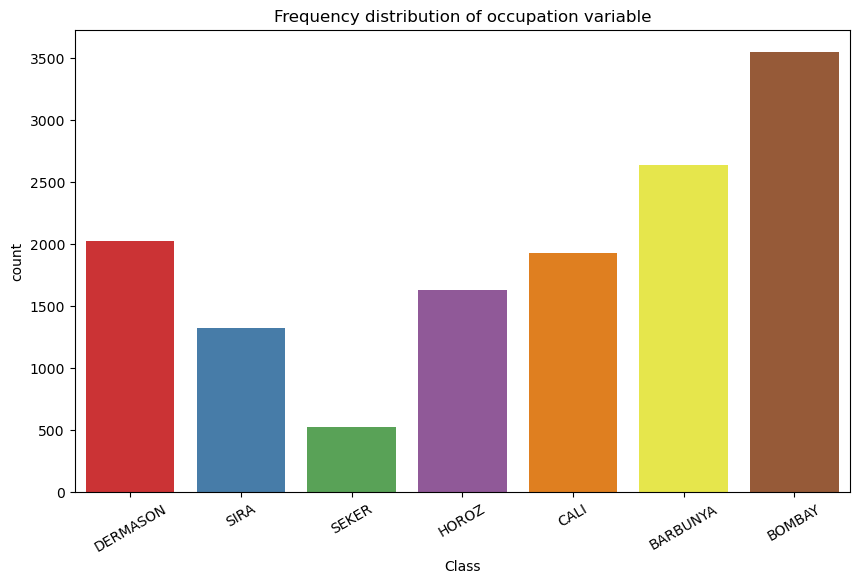

In [118]:
f, ax = plt.subplots(figsize=(10, 6))
ax = sns.countplot(x="Class", data=data, palette="Set1")
ax.set_title("Frequency distribution of occupation variable")
ax.set_xticklabels(data.Class.value_counts().index, rotation=30)
plt.show()

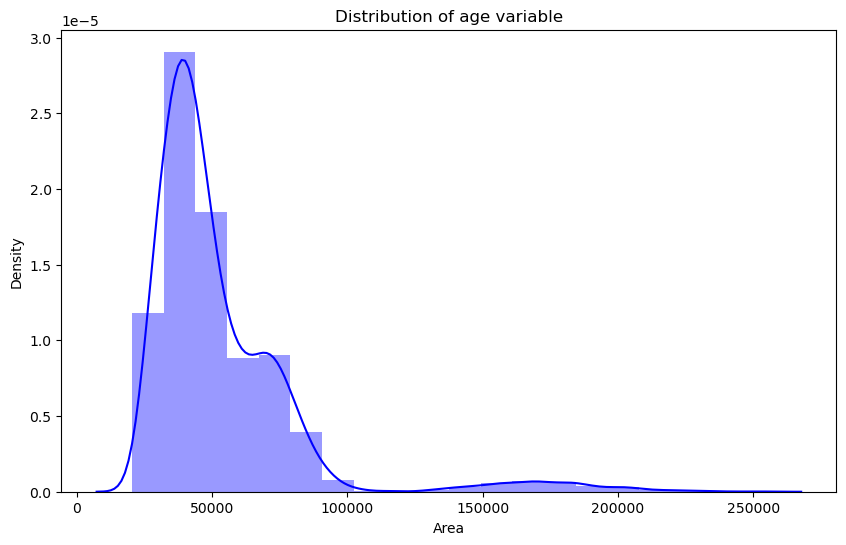

In [119]:
f, ax = plt.subplots(figsize=(10, 6))
x = data['Area']
ax = sns.distplot(x, bins=20, color='blue')
ax.set_title("Distribution of age variable")
plt.show()

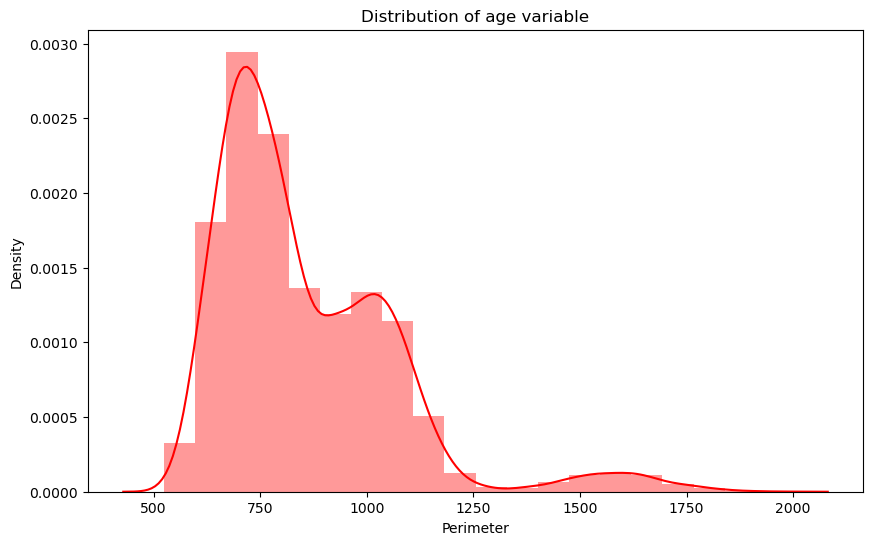

In [120]:
f, ax = plt.subplots(figsize=(10, 6))
x = data['Perimeter']
ax = sns.distplot(x, bins=20, color='red')
ax.set_title("Distribution of age variable")
plt.show()

In [121]:
def get_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [122]:
X = data.drop(columns=['Class'])
y = data['Class']

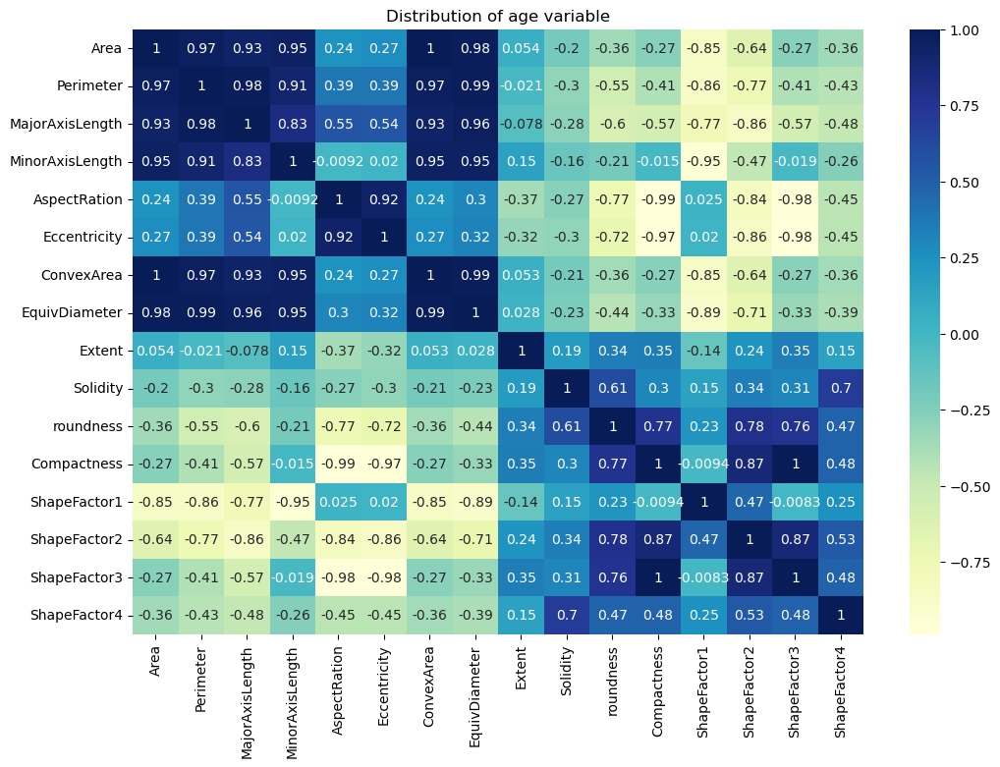

In [123]:
corr_matrix = X.corr()
f, ax = plt.subplots(figsize=(12, 8))
ax = sns.heatmap(corr_matrix, cmap="YlGnBu", annot=True)
ax.set_title("Distribution of age variable")
plt.show()

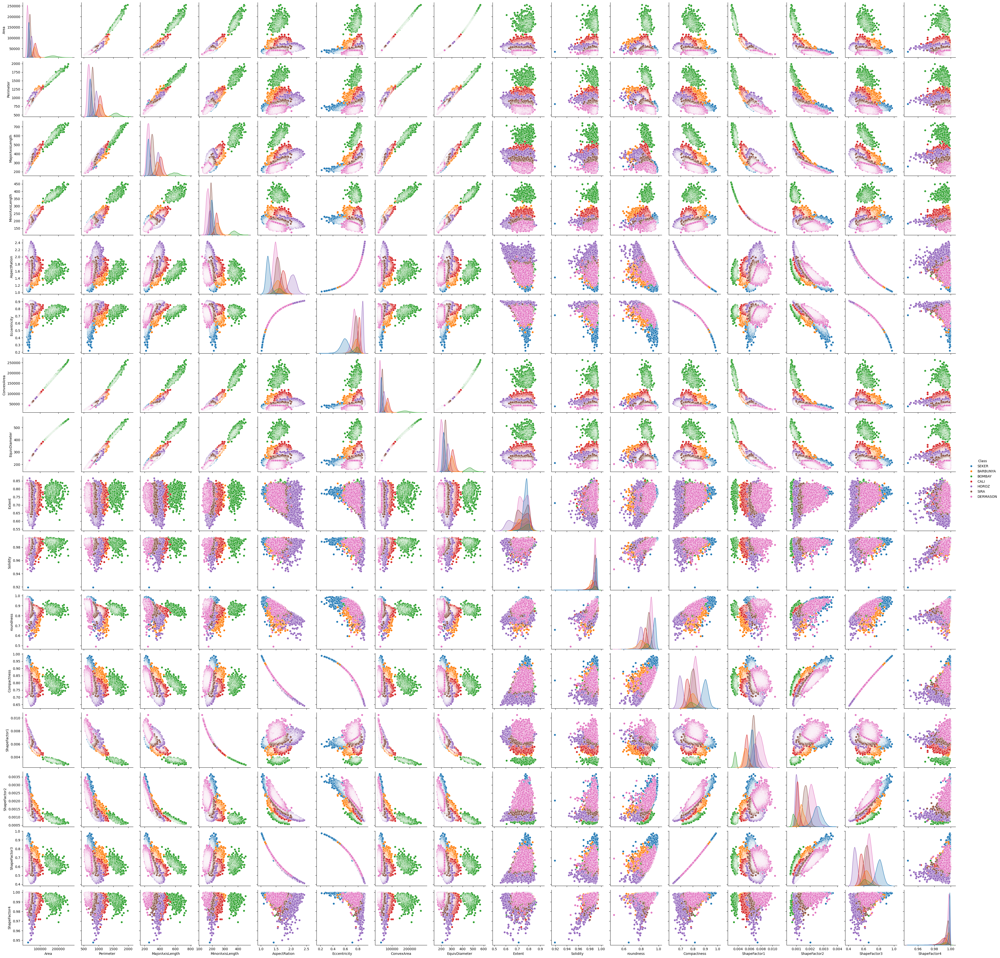

In [124]:
sns.pairplot(data, hue='Class')
plt.show()

In [125]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [126]:
sta = StandardScaler()
X_train = sta.fit_transform(X_train)
X_test = sta.transform(X_test)

In [127]:
model = RandomForestClassifier(criterion='entropy', random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', random_state=42)

In [128]:
get_score(model, X_train, y_train, X_test, y_test, train=True)
get_score(model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
           BARBUNYA  BOMBAY    CALI  DERMASON   HOROZ   SEKER    SIRA  \
precision       1.0     1.0     1.0       1.0     1.0     1.0     1.0   
recall          1.0     1.0     1.0       1.0     1.0     1.0     1.0   
f1-score        1.0     1.0     1.0       1.0     1.0     1.0     1.0   
support      1061.0   405.0  1313.0    2875.0  1520.0  1614.0  2100.0   

           accuracy  macro avg  weighted avg  
precision       1.0        1.0           1.0  
recall          1.0        1.0           1.0  
f1-score        1.0        1.0           1.0  
support         1.0    10888.0       10888.0  
_______________________________________________
Confusion Matrix: 
 [[1061    0    0    0    0    0    0]
 [   0  405    0    0    0    0    0]
 [   0    0 1313    0    0    0    0]
 [   0    0    0 2875    0    0    0]
 [   0    0    0    0 1520    0    0]
 [   0    0    0    0    0 1614 

In [129]:
model.feature_importances_

array([0.04937985, 0.11158272, 0.12112264, 0.0832287 , 0.0388405 ,
       0.04566834, 0.06863128, 0.06924848, 0.00882524, 0.01617143,
       0.03986489, 0.08030117, 0.10627041, 0.0614435 , 0.07356847,
       0.02585238])

In [130]:
feature_importance = pd.DataFrame({'model':model.feature_importances_},index = data.drop(columns = ['Class']).columns)

In [131]:
print(feature_importance)

                    model
Area             0.049380
Perimeter        0.111583
MajorAxisLength  0.121123
MinorAxisLength  0.083229
AspectRation     0.038841
Eccentricity     0.045668
ConvexArea       0.068631
EquivDiameter    0.069248
Extent           0.008825
Solidity         0.016171
roundness        0.039865
Compactness      0.080301
ShapeFactor1     0.106270
ShapeFactor2     0.061443
ShapeFactor3     0.073568
ShapeFactor4     0.025852


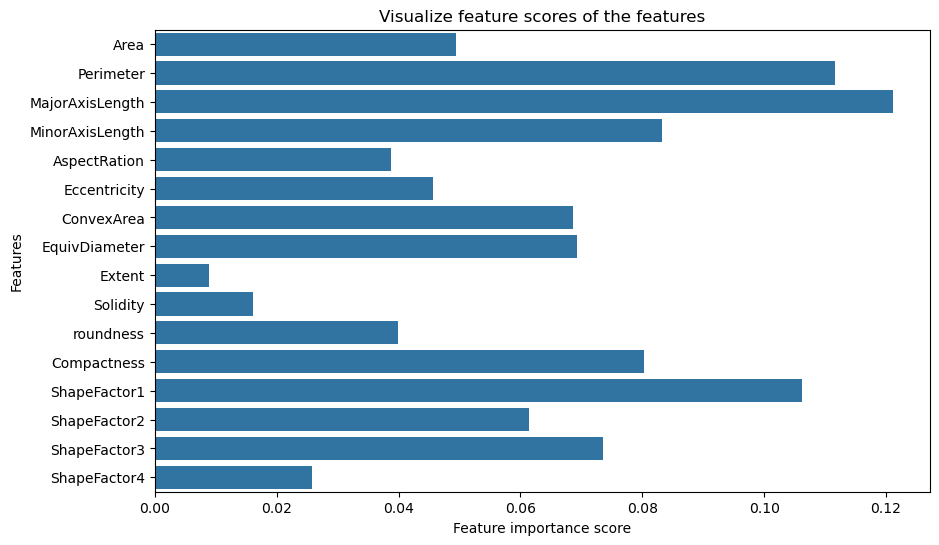

In [132]:
f, ax = plt.subplots(figsize=(10, 6))
ax = sns.barplot(x=feature_importance.model, y=feature_importance.index)
ax.set_title("Visualize feature scores of the features")
ax.set_yticklabels(feature_importance.index)
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
plt.show()

In [136]:
print(classification_report(y_test, model.predict(X_test)))

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.90      0.91       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.92      0.94      0.93       317
    DERMASON       0.90      0.92      0.91       671
       HOROZ       0.97      0.95      0.96       408
       SEKER       0.96      0.94      0.95       413
        SIRA       0.87      0.88      0.88       536

    accuracy                           0.92      2723
   macro avg       0.94      0.93      0.94      2723
weighted avg       0.92      0.92      0.92      2723

